In [1]:
from transformers import VisionEncoderDecoderModel, ViTImageProcessor, AutoTokenizer
import torch
from PIL import Image
from diffusers import AutoPipelineForText2Image, StableDiffusionPipeline
from train_video import RateDistortionLoss
import requests
from transformers import AutoProcessor, LlavaForConditionalGeneration
import numpy as np
from utils import *

/data/maryam.sana/anaconda3/envs/compressai/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [ ]:
model_path = "sd_jockey"
pipe = StableDiffusionPipeline.from_pretrained(model_path, torch_dtype=torch.float16)
pipe.to("cuda")

image = pipe(prompt="horses ").images[0]
image

 76%|███████████████████████████████████████████████████████████▎                  | 38/50 [00:01<00:00, 26.69it/s]

In [2]:
model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
feature_extractor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
tokenizer = AutoTokenizer.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
max_length = 16
num_beams = 4
gen_kwargs = {"max_length": max_length, "num_beams": num_beams}

In [3]:
def predict_step(image_paths):
  images = []
  for image_path in image_paths:
    i_image = Image.open(image_path)
    if i_image.mode != "RGB":
      i_image = i_image.convert(mode="RGB")

    images.append(i_image)

  pixel_values = feature_extractor(images=images, return_tensors="pt").pixel_values
  pixel_values = pixel_values.to(device)

  output_ids = model.generate(pixel_values, **gen_kwargs)

  preds = tokenizer.batch_decode(output_ids, skip_special_tokens=True)
  preds = [pred.strip() for pred in preds]
  return preds

In [4]:
caption = predict_step(['Jockey/img00001.png']) #['a man riding a horse on top of a track']

We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
You may ignore this warning if your `pad_token_id` (50256) is identical to the `bos_token_id` (50256), `eos_token_id` (50256), or the `sep_token_id` (None), and your input is not padded.


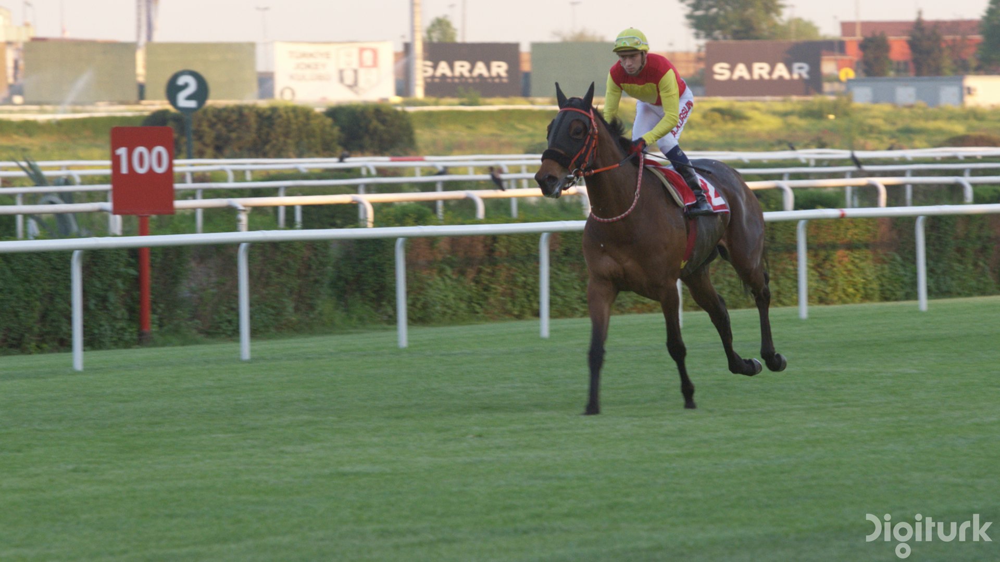

In [11]:
image_orig = Image.open('Jockey/img00001.png')
image_orig

In [7]:
image_orig.size

(1920, 1080)

In [8]:
pipeline = AutoPipelineForText2Image.from_pretrained(
	"runwayml/stable-diffusion-v1-5", torch_dtype=torch.float16, variant="fp16"
).to("cuda")

Loading pipeline components...: 100%|███████████████████████████████████████████████| 7/7 [00:00<00:00,  8.57it/s]


['a man riding a horse on top of a track']


100%|█████████████████████████████████████████████████████████████████████████████| 50/50 [00:21<00:00,  2.36it/s]


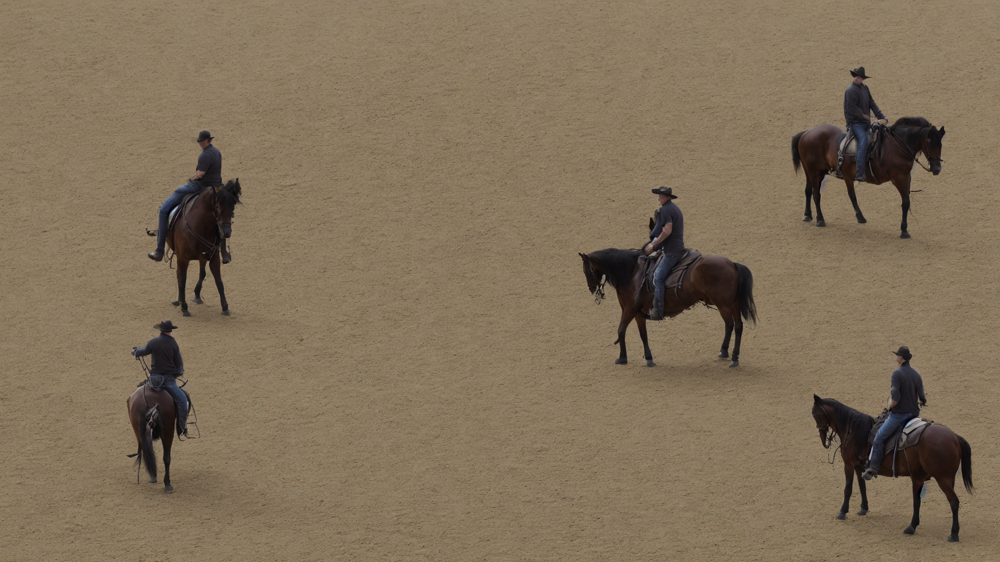

In [12]:
print(caption)
image = pipeline(
	caption, height=image_orig.size[1], width=image_orig.size[0]
).images[0]
image

In [13]:
mse_loss(image_orig, image)

99.70121945730453

In [20]:
image.save('results/vit_gpt2_img2.png')

(1920, 1080)

In [14]:
model = LlavaForConditionalGeneration.from_pretrained("llava-hf/llava-1.5-7b-hf")
processor = AutoProcessor.from_pretrained("llava-hf/llava-1.5-7b-hf")

/data/maryam.sana/anaconda3/envs/compressai/lib/python3.12/site-packages/transformers/models/llava/configuration_llava.py:104: FutureWarning: The `vocab_size` argument is deprecated and will be removed in v4.42, since it can be inferred from the `text_config`. Passing this argument has no effect
  warnings.warn(
Loading checkpoint shards: 100%|████████████████████████████████████████████████████| 3/3 [00:02<00:00,  1.15it/s]
Special tokens have been added in the vocabulary, make sure the associated word embeddings are fine-tuned or trained.


In [15]:
prompt = "<image>\nUSER:Give a detailed visual description of this image ?\nASSISTANT:"
inputs = processor(text=prompt, images=image_orig, return_tensors="pt")

# Generate
generate_ids = model.generate(**inputs, max_length=200)
caption_llava = processor.batch_decode(generate_ids, skip_special_tokens=True, clean_up_tokenization_spaces=False)[0]
print(caption_llava.split('ASSISTANT:')[1])

 The image features a man riding a brown horse on a grassy field. The man is wearing a yellow shirt and a red and white hat, which adds a pop of color to the scene. The horse is galloping, and the man appears to be enjoying the ride.

In the background, there are several birds scattered around the field, adding to the natural atmosphere of the scene. The overall setting is a lively and engaging outdoor environment.


In [12]:
with open('caption.txt', 'w') as f:
    f.write(caption_llava.split('ASSISTANT:')[1])

Token indices sequence length is longer than the specified maximum sequence length for this model (89 > 77). Running this sequence through the model will result in indexing errors
The following part of your input was truncated because CLIP can only handle sequences up to 77 tokens: ['. the overall setting is a lively and engaging outdoor environment.']
100%|█████████████████████████████████████████████████████████████████████████████| 50/50 [00:21<00:00,  2.37it/s]


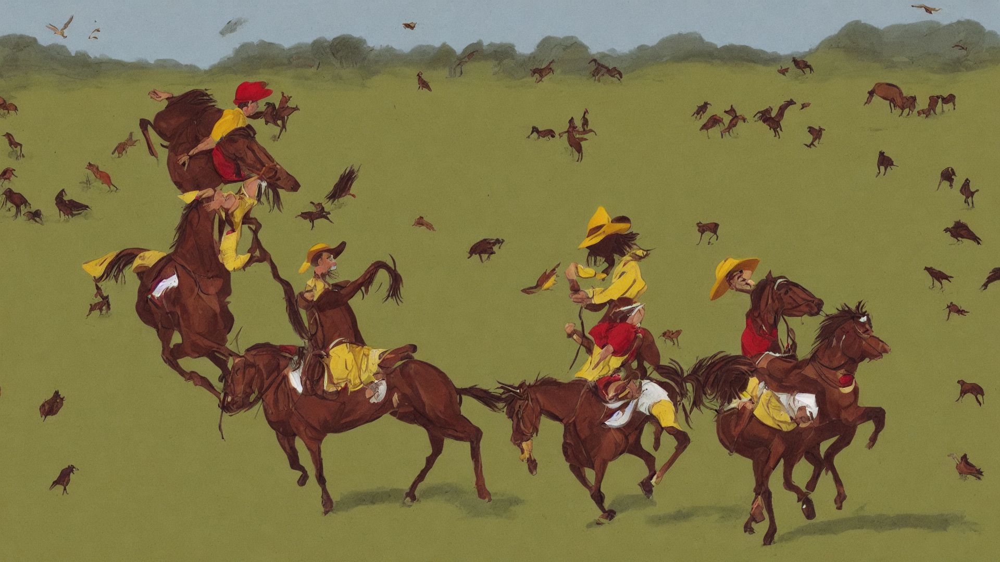

In [16]:
image2 = pipeline(
	caption_llava.split('ASSISTANT:')[1],  height=image_orig.size[1], width=image_orig.size[0]
).images[0]
image2

In [17]:
mse_loss(image_orig, image2)

102.67592914094651

In [15]:
image2.save('results/llava_img4.png')

In [13]:
# Calculate PSNR
psnr = calculate_psnr(image_orig, image2)

# Print PSNR
print('PSNR:', psnr)
reconstructed_image_path = 'results/vit_gpt2_img2.png'
image_size = Image.open(reconstructed_image_path).size

reconstructed_bpp = calculate_bpp('caption.txt', image_size)

print("Bits per pixel of reconstructed image:", reconstructed_bpp)

Bits per pixel of reconstructed image: 0.01275634765625
